### Importing Libraries

In [2]:
import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 110)
import numpy as np
import matplotlib.pyplot as plt
import missingno
import seaborn as sns
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from category_encoders import BinaryEncoder
%matplotlib inline

## Exploring Train Data

In [3]:
df_train = pd.read_csv("train_data.csv")
df_train.describe()

,event_id,time_to_tca,mission_id,risk,max_risk_estimate,max_risk_scaling,miss_distance,relative_speed,relative_position_r,relative_position_t,relative_position_n,relative_velocity_r,relative_velocity_t,relative_velocity_n,t_time_lastob_start,t_time_lastob_end,t_recommended_od_span,t_actual_od_span,t_obs_available,t_obs_used,t_residuals_accepted,t_weighted_rms,t_rcs_estimate,t_cd_area_over_mass,t_cr_area_over_mass,t_sedr,t_j2k_sma,t_j2k_ecc,t_j2k_inc,t_ct_r,t_cn_r,t_cn_t,t_crdot_r,t_crdot_t,t_crdot_n,t_ctdot_r,t_ctdot_t,t_ctdot_n,t_ctdot_rdot,t_cndot_r,t_cndot_t,t_cndot_n,t_cndot_rdot,t_cndot_tdot,c_time_lastob_start,c_time_lastob_end,c_recommended_od_span,c_actual_od_span,c_obs_available,c_obs_used,c_residuals_accepted,c_weighted_rms,c_rcs_estimate,c_cd_area_over_mass,c_cr_area_over_mass,c_sedr,c_j2k_sma,c_j2k_ecc,c_j2k_inc,c_ct_r,c_cn_r,c_cn_t,c_crdot_r,c_crdot_t,c_crdot_n,c_ctdot_r,c_ctdot_t,c_ctdot_n,c_ctdot_rdot,c_cndot_r,c_cndot_t,c_cndot_n,c_cndot_rdot,c_cndot_tdot,t_span,c_span,t_h_apo,t_h_per,c_h_apo,c_h_per,geocentric_latitude,azimuth,elevation,mahalanobis_distance,t_position_covariance_det,c_position_covariance_det,t_sigma_r,c_sigma_r,t_sigma_t,c_sigma_t,t_sigma_n,c_sigma_n,t_sigma_rdot,c_sigma_rdot,t_sigma_tdot,c_sigma_tdot,t_sigma_ndot,c_sigma_ndot,F10,F3M,SSN,AP
count,162634.000000,162634.000000,162634.000000,162634.000000,162634.000000,1.626340e+05,162634.000000,162634.000000,162634.000000,162634.000000,162634.000000,162634.000000,162634.000000,162634.000000,162634.000000,162634.000000,162634.000000,162634.000000,162634.000000,162634.000000,162634.000000,162634.000000,159357.000000,162634.000000,162634.000000,162634.000000,162634.000000,162634.000000,162634.000000,162634.000000,162634.000000,162634.000000,153404.000000,153404.000000,153404.000000,153404.000000,153404.000000,153404.000000,153404.000000,153404.000000,153404.000000,153404.000000,153404.000000,153404.000000,162623.000000,162623.000000,162623.000000,162623.000000,162623.000000,162623.000000,162623.000000,162623.000000,109793.000000,162634.000000,162634.000000,162634.000000,162634.000000,162634.000000,162634.000000,162623.000000,162623.000000,162623.000000,153393.000000,153393.000000,153393.000000,153393.000000,153393.000000,153393.000000,153393.000000,153393.000000,153393.000000,153393.000000,153393.000000,153393.000000,162634.000000,162634.000000,162634.000000,162634.000000,162634.000000,162634.000000,162634.000000,162634.000000,162634.000000,1.626340e+05,1.626340e+05,1.626340e+05,1.626340e+05,1.626230e+05,1.626340e+05,1.626230e+05,1.626340e+05,1.626230e+05,153404.000000,153393.000000,153404.000000,153393.000000,153404.000000,153393.000000,155812.000000,155812.000000,155812.000000,155812.000000
mean,6566.871798,3.350190,7.117786,-19.340603,-6.282332,5.374025e+04,16531.662088,10655.819638,-40.198451,53.578336,95.253443,0.028265,-8761.327045,-54.009080,1.028149,0.000941,4.032207,3.799743,952.684396,907.669220,98.907999,1.123267,2.960459,0.013143,0.011319,0.000121,7039.420999,0.001904,95.408630,-0.099422,0.138713,0.001965,0.089312,-0.973406,0.000226,-0.971794,0.045442,-0.143993,-0.049498,0.062686,0.001286,0.209073,0.000029,-0.063875,40.150834,0.589664,12.663576,12.026755,65.933374,59.158495,98.784291,1.978627,0.461612,0.784301,0.346478,0.002985,7200.009977,0.016133,86.473026,-0.217449,0.109592,0.014433,0.207296,-0.981466,-0.008321,-0.858330,0.170700,-0.131089,-0.170459,0.166630,-0.000130,0.277172,0.002046,-0.186402,8.945041,2.343352,674.664672,647.903325,1020.431444,623.314510,-0.664117,-0.000716,-0.020129,1.926028e+02,1.029088e+45,1.097804e+45,9.749591e+05,1.040560e+06,9.753624e+05,1.071755e+06,9.749556e+05,1.040225e+06,1227.347518,1160.845886,1227.006677,1127.804515,1227.004465,1127.809273,78.095853,79.049085,20.589480,8.608034
std,3798.407314,2.013114,5.800144,10.011641,1.012544,9.086958e+05,14269.027951,4340.235720,644.192617,14780.303961,16063.415176,145.104894,5244.683859,5301.271587,2.219278,0.035317,1.108141,1.312433,1023.700258,1014.129914,1.61

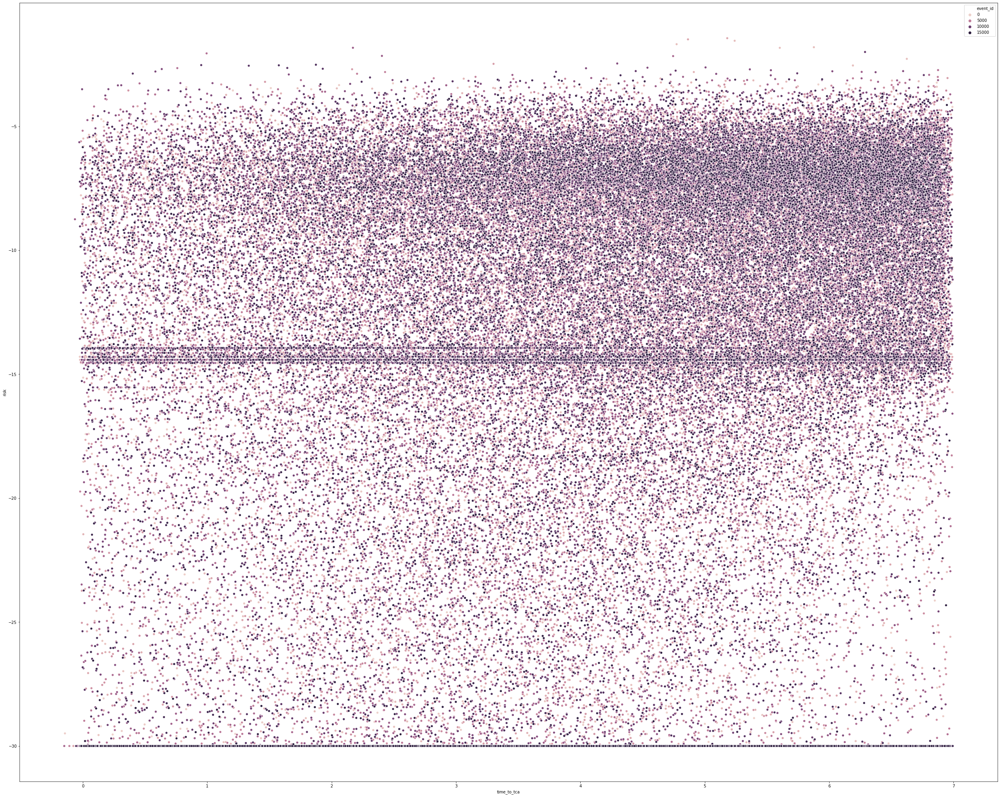

In [4]:
plt.figure(figsize=(44,36))
sns.scatterplot(x="time_to_tca", y="risk", data=df_train, hue="event_id")

In [5]:
# Create new column risk-class 
## True: risk >= -6
## False: risk < -6

df_train["risk-class"] = (df_train.risk >= -6)
df_train["risk-class"].value_counts()

False    152451
True      10183
Name: risk-class, dtype: int64

In [6]:
df_train

,event_id,time_to_tca,mission_id,risk,max_risk_estimate,max_risk_scaling,miss_distance,relative_speed,relative_position_r,relative_position_t,relative_position_n,relative_velocity_r,relative_velocity_t,relative_velocity_n,t_time_lastob_start,t_time_lastob_end,t_recommended_od_span,t_actual_od_span,t_obs_available,t_obs_used,t_residuals_accepted,t_weighted_rms,t_rcs_estimate,t_cd_area_over_mass,t_cr_area_over_mass,t_sedr,t_j2k_sma,t_j2k_ecc,t_j2k_inc,t_ct_r,t_cn_r,t_cn_t,t_crdot_r,t_crdot_t,t_crdot_n,t_ctdot_r,t_ctdot_t,t_ctdot_n,t_ctdot_rdot,t_cndot_r,t_cndot_t,t_cndot_n,t_cndot_rdot,t_cndot_tdot,c_object_type,c_time_lastob_start,c_time_lastob_end,c_recommended_od_span,c_actual_od_span,c_obs_available,c_obs_used,c_residuals_accepted,c_weighted_rms,c_rcs_estimate,c_cd_area_over_mass,c_cr_area_over_mass,c_sedr,c_j2k_sma,c_j2k_ecc,c_j2k_inc,c_ct_r,c_cn_r,c_cn_t,c_crdot_r,c_crdot_t,c_crdot_n,c_ctdot_r,c_ctdot_t,c_ctdot_n,c_ctdot_rdot,c_cndot_r,c_cndot_t,c_cndot_n,c_cndot_rdot,c_cndot_tdot,t_span,c_span,t_h_apo,t_h_per,c_h_apo,c_h_per,geocentric_latitude,azimuth,elevation,mahalanobis_distance,t_position_covariance_det,c_position_covariance_det,t_sigma_r,c_sigma_r,t_sigma_t,c_sigma_t,t_sigma_n,c_sigma_n,t_sigma_rdot,c_sigma_rdot,t_sigma_tdot,c_sigma_tdot,t_sigma_ndot,c_sigma_ndot,F10,F3M,SSN,AP,risk-class
0,0,1.566798,5,-10.204955,-7.834756,8.602101,14923.0,13792.0,453.8,5976.6,-13666.8,-7.2,-12637.0,-5525.9,1.0,0.0,3.78,3.78,459,458,98.9,1.265,0.4020,0.013826,0.007173,0.000051,6996.918867,0.003997,97.806412,-0.397969,0.292258,0.040799,0.394221,-0.999674,-0.038498,-0.981098,0.214612,-0.316493,-0.210247,0.170737,-0.001551,0.531593,0.002117,-0.179278,UNKNOWN,180.0,2.0,15.85,15.85,15.0,15.0,100.0,2.360,NaN,0.348701,0.126607,0.001406,7006.607320,0.003144,74.045735,-0.824859,0.473976,-0.002576,0.825216,-0.999998,0.003565,-0.732954,0.220006,-0.814249,-0.220621,0.249855,0.196620,0.722186,-0.196908,-0.668487,1.0,2.0,646.745439,590.818294,650.497251,606.443389,-73.574095,-23.618769,0.029910,129.430951,7.373471e+05,4.429923e+16,4.057932,266.722309,137.617114,54366.864909,1.781418,46.612573,0.147350,58.272095,0.004092,0.165044,0.002987,0.386462,89.0,83.0,42.0,11.0,False
1,0,1.207494,5,-10.355758,-7.848937,8.956374,14544.0,13792.0,474.3,5821.2,-13319.8,-7.0,-12637.0,-5525.9,1.0,0.0,3.79,3.79,456,455,98.5,1.270,0.4020,0.013487,0.009139,0.000060,6996.920255,0.003996,97.806420,-0.073137,0.297366,0.060541,0.069652,-0.998192,-0.052511,-0.994240,-0.029644,-0.302333,0.034030,0.179696,0.001552,0.561142,-0.005165,-0.181036,UNKNOWN,180.0,2.0,15.85,15.85,15.0,15.0,100.0,2.360,NaN,0.348701,0.126607,0.001406,7006.621053,0.003144,74.045736,-0.818207,0.482754,-0.003578,0.818573,-0.999998,0.004574,-0.728759,0.202595,-0.817490,-0.203216,0.258964,0.195718,0.721903,-0.196008,-0.674979,1.0,2.0,646.743506,590.823004,650.513314,606.454793,-73.570690,-23.618769,0.029079,271.540424,1.141390e+05,4.378610e+16,3.526780,262.191819,56.070117,54082.067268,1.800959,46.595869,0.059672,57.966413,0.003753,0.164383,0.002933,0.386393,89.0,83.0,42.0,11.0,False
2,0,0.952193,5,-10.345631,-7.847406,8.932195,14475.0,13792.0,474.6,5796.2,-13256.1,-7.0,-12637.0,-5525.9,1.0,0.0,3.79,3.80,456,455,98.5,1.257,0.4020,0.013357,0.007057,0.000060,6996.920553,0.003996,97.806418,-0.109230,0.305189,0.043711,0.107079,-0.996235,-0.034287,-0.996674,0.033933,-0.308501,-0.030161,0.123760,0.019630,0.579274,-0.023726,-0.125737,UNKNOWN,180.0,2.0,15.85,15.85,15.0,15.0,100.0,2.360,NaN,0.348701,0.126607,0.001406,7006.623524,0.003144,74.045737,-0.817408,0.483828,-0.003742,0.817774,-0.999998,0.004738,-0.729083,0.201698,-0.817662,-0.202320,0.260092,0.195558,0.721854,-0.195849,-0.675347,1.0,2.0,646.745607,590.821499,650.515082,606.457965,-73.570088,-23.618769,0.029079,347.899292,4.696004e+04,4.369105e+16,3.362037,261.666544,37.497947,54027.391201,1.821940,46.592757,0.039258,57.907599,0.003576,0.164352,0.002967,0.386381,89.0,83.0,42.0,11.0,False
3,0,0.579669,5,-10.337809,-7.845880,8.913444,14579.0,13792.0,472.7,5

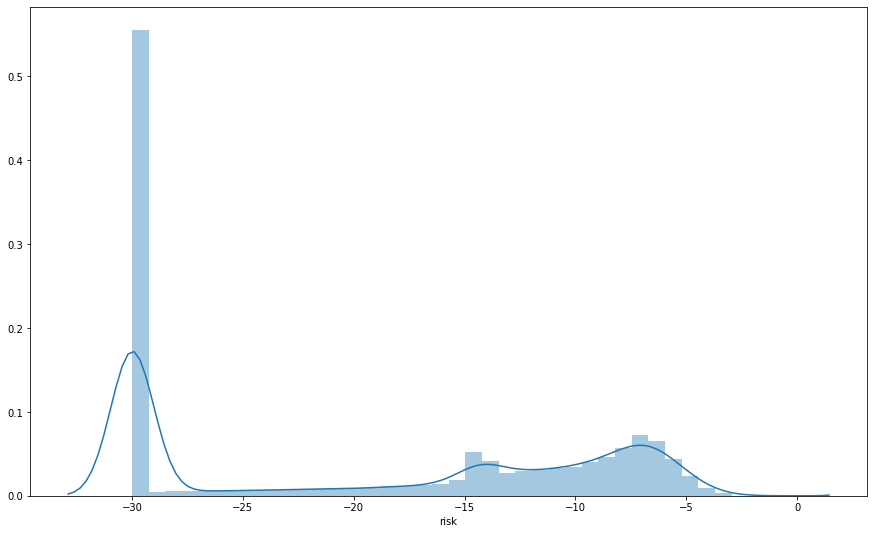

In [7]:
plt.figure(figsize=(15,9))
sns.distplot(df_train["risk"]);

https://towardsdatascience.com/methods-for-dealing-with-imbalanced-data-5b761be45a18

install swifter

In [8]:
df_train["event_id"].value_counts()

5319     23
11942    23
7088     23
4377     22
4906     22
         ..
4567      1
9765      1
12449     1
2388      1
1514      1
Name: event_id, Length: 13154, dtype: int64

In [9]:
print("Lengths of time series:")
df_train.groupby(["event_id"])["risk"].count().value_counts()

Lengths of time series:


21    2810
20    1551
2     1198
3     1006
4      729
6      619
5      596
7      588
19     494
9      376
8      321
10     319
12     299
11     291
13     281
14     277
15     271
16     248
18     245
1      225
17     215
22     192
23       3
Name: risk, dtype: int64

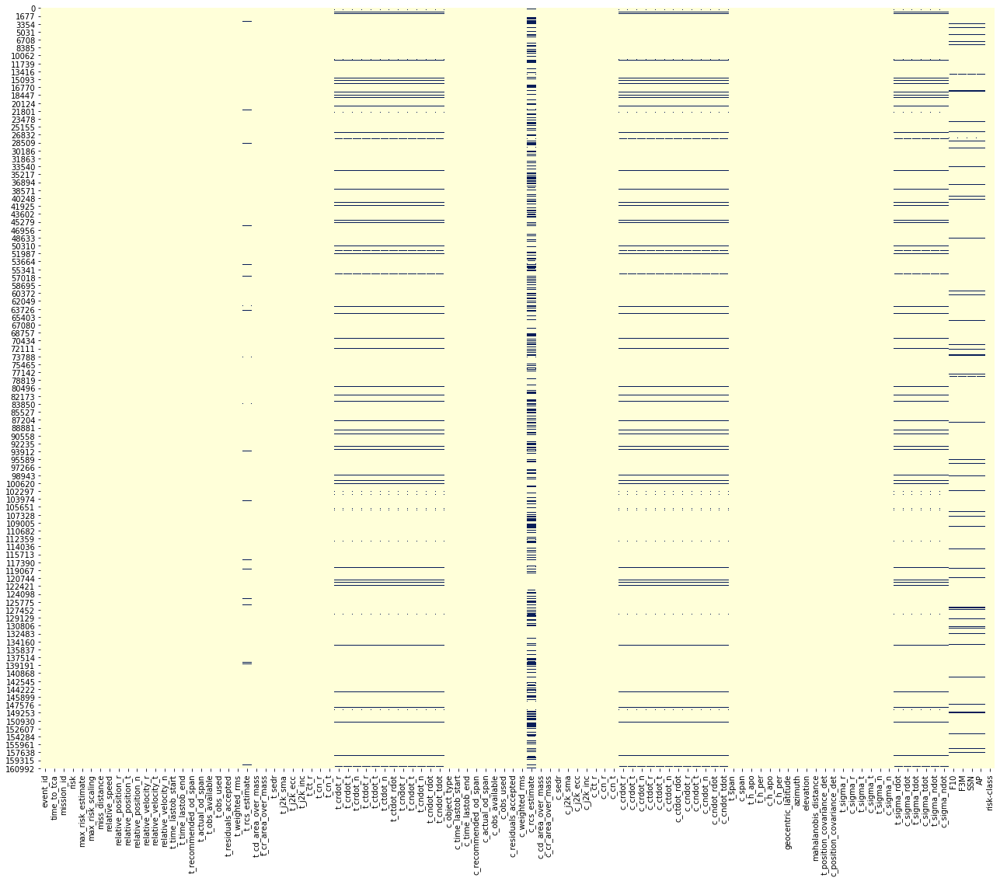

In [14]:
plt.figure(figsize=(22,18))
cmap = sns.light_palette((260, 75, 60), input="husl", as_cmap=True, reverse=True)
sns.heatmap(df_train.isnull(),cmap="YlGnBu",cbar=False)

In [10]:
df_train.isnull().sum(axis=0).to_frame().sort_values(by=0, ascending=False)

,0
c_rcs_estimate,52841
c_crdot_t,9241
c_sigma_tdot,9241
c_cndot_rdot,9241
c_cndot_tdot,9241
c_cndot_t,9241
c_sigma_rdot,9241
c_cndot_r,9241
c_cndot_n,9241
c_ctdot_rdot,9241


In [11]:
df_train.isnull().sum(axis=1).sort_values(ascending=False).to_frame().sort_values(by=0, ascending=False) #row

,0
68135,31
148936,31
69788,31
26481,31
26482,31
...,...
24514,0
24513,0
24512,0
24510,0


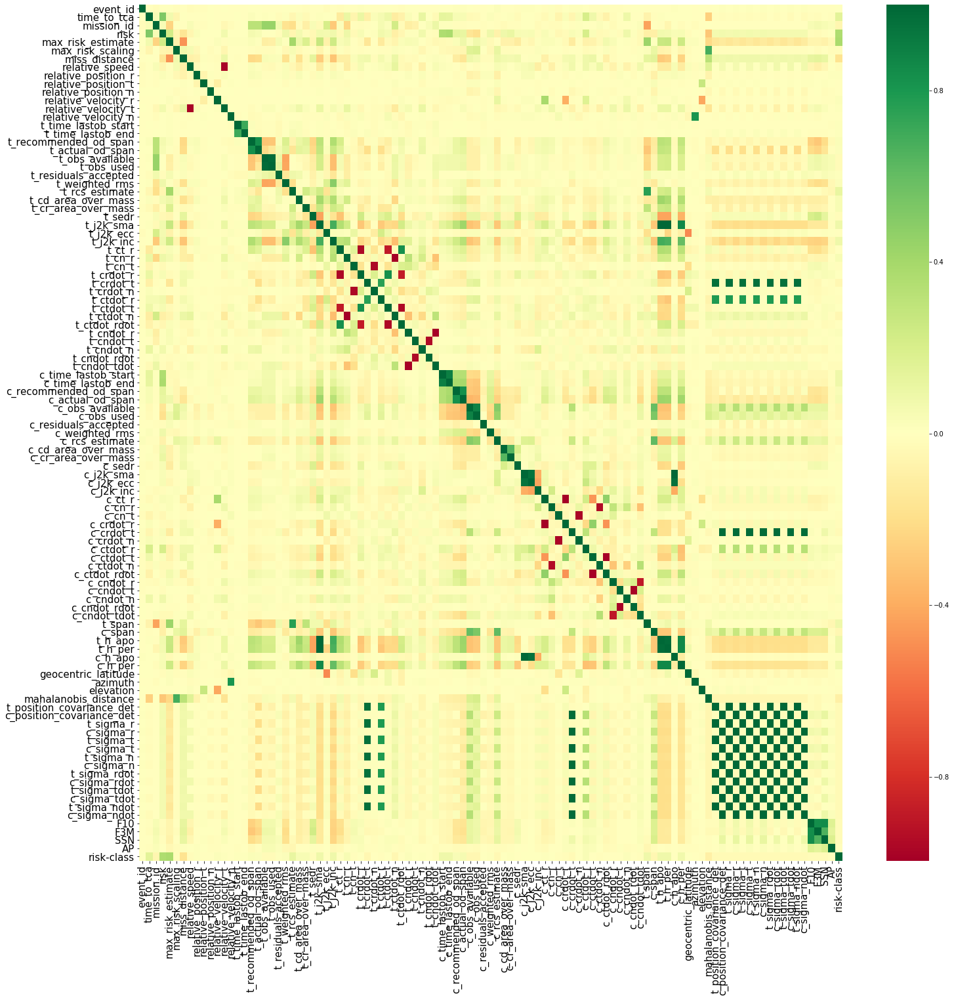

In [12]:
#Global
plt.figure(figsize=(24,24))
hm = sns.heatmap(df_train.corr(),cmap="RdYlGn", annot=False)
bottom, top = hm.get_ylim()
hm.set_ylim(bottom + 0.5, top - 0.5)
hm.set_xticklabels(hm.get_xmajorticklabels(), fontsize = 15)
hm.set_yticklabels(hm.get_ymajorticklabels(), fontsize = 15) 
plt.show()

## Exploring Test Data

In [13]:
df_test = pd.read_csv("test_data.csv")
df_test

,event_id,time_to_tca,mission_id,risk,max_risk_estimate,max_risk_scaling,miss_distance,relative_speed,relative_position_r,relative_position_t,relative_position_n,relative_velocity_r,relative_velocity_t,relative_velocity_n,t_time_lastob_start,t_time_lastob_end,t_recommended_od_span,t_actual_od_span,t_obs_available,t_obs_used,t_residuals_accepted,t_weighted_rms,t_rcs_estimate,t_cd_area_over_mass,t_cr_area_over_mass,t_sedr,t_j2k_sma,t_j2k_ecc,t_j2k_inc,t_ct_r,t_cn_r,t_cn_t,t_crdot_r,t_crdot_t,t_crdot_n,t_ctdot_r,t_ctdot_t,t_ctdot_n,t_ctdot_rdot,t_cndot_r,t_cndot_t,t_cndot_n,t_cndot_rdot,t_cndot_tdot,c_object_type,c_time_lastob_start,c_time_lastob_end,c_recommended_od_span,c_actual_od_span,c_obs_available,c_obs_used,c_residuals_accepted,c_weighted_rms,c_rcs_estimate,c_cd_area_over_mass,c_cr_area_over_mass,c_sedr,c_j2k_sma,c_j2k_ecc,c_j2k_inc,c_ct_r,c_cn_r,c_cn_t,c_crdot_r,c_crdot_t,c_crdot_n,c_ctdot_r,c_ctdot_t,c_ctdot_n,c_ctdot_rdot,c_cndot_r,c_cndot_t,c_cndot_n,c_cndot_rdot,c_cndot_tdot,t_span,c_span,t_h_apo,t_h_per,c_h_apo,c_h_per,geocentric_latitude,azimuth,elevation,mahalanobis_distance,t_position_covariance_det,c_position_covariance_det,t_sigma_r,c_sigma_r,t_sigma_t,c_sigma_t,t_sigma_n,c_sigma_n,t_sigma_rdot,c_sigma_rdot,t_sigma_tdot,c_sigma_tdot,t_sigma_ndot,c_sigma_ndot,F10,F3M,SSN,AP
0,0,6.842095,19,-7.296967,-7.208941,1.787894,31816.0,7929.0,-365.5,26967.0,16880.6,-26.3,-4207.7,6720.9,1.0,0.0,7.50,7.49,215,214,99.4,1.293,0.4344,0.015128,0.016234,0.000018,7084.698187,0.003744,98.217983,-0.270354,-0.657060,0.196264,0.210330,-0.997253,-0.142771,-0.998425,0.216358,0.656637,-0.155433,0.456629,-0.108973,-0.086419,0.081347,-0.456798,UNKNOWN,180.0,2.0,29.45,29.44,18.0,17.0,83.3,4.113,NaN,0.308274,0.106612,0.000379,7082.280567,0.004097,74.114497,-0.012443,-0.589099,0.063823,0.017109,-0.999983,-0.064830,-0.999539,-0.015848,0.588556,0.011187,0.182553,-0.142693,-0.506554,0.142522,-0.178864,1.5,2.0,733.085558,680.036816,733.157975,675.129158,-66.171283,57.950882,0.190036,52.081328,7.748198e+07,4.812243e+16,7.414544,212.775210,359.072138,28182.398762,4.557019,45.386672,0.371943,29.669476,0.007763,0.223996,0.011833,1.375099,76.0,74.0,29.0,11.0
1,0,6.571818,19,-7.282496,-7.199833,1.759386,31095.0,7929.0,-361.8,26356.6,16497.2,-25.6,-4207.7,6720.9,1.0,0.0,7.50,7.49,215,214,99.4,1.293,0.4344,0.015128,0.016234,0.000018,7084.697461,0.003744,98.217984,-0.273973,-0.656964,0.199647,0.212957,-0.997155,-0.145260,-0.998472,0.220856,0.656541,-0.158922,0.456633,-0.110415,-0.086295,0.082320,-0.456824,UNKNOWN,180.0,2.0,29.45,29.44,18.0,17.0,83.3,4.113,NaN,0.308274,0.106612,0.000379,7082.282379,0.004097,74.114498,-0.011881,-0.588955,0.064956,0.016580,-0.999983,-0.065971,-0.999553,-0.015964,0.588383,0.011270,0.182546,-0.143287,-0.507868,0.143116,-0.178881,1.5,2.0,733.085727,680.035195,733.159131,675.131626,-66.174477,57.950882,0.184979,51.832431,7.452485e+07,4.752620e+16,7.413035,212.758643,352.579069,27984.451040,4.556956,45.426864,0.364986,29.460828,0.007762,0.223983,0.011833,1.375117,75.0,74.0,24.0,9.0
2,0,6.112986,19,-7.316053,-7.217886,1.824263,32202.0,7929.0,-370.7,27294.4,17085.1,-26.6,-4207.7,6720.9,1.0,0.0,7.79,7.79,209,208,99.5,1.298,0.4344,0.014540,0.020434,0.000017,7084.698697,0.003744,98.218012,-0.361151,-0.560374,0.235602,0.295058,-0.996456,-0.183190,-0.998904,0.317612,0.559722,-0.250362,0.422270,-0.110323,0.025867,0.085265,-0.423264,UNKNOWN,180.0,2.0,29.45,29.44,18.0,17.0,83.3,4.113,NaN,0.308274,0.106612,0.000379,7082.279019,0.004097,74.114497,-0.013286,-0.589183,0.063440,0.017940,-0.999983,-0.064445,-0.999520,-0.015601,0.588660,0.010952,0.182607,-0.142473,-0.505868,0.142302,-0.178876,1.5,2.0,733.086160,680.037234,733.156904,675.127135,-66.169549,57.950882,0.192204,63.876219,5.821566e+07,4.833258e+16,7.834560,212.784398,295.356632,28256.047140,4.273193,45.365681,0.303518,29.747208,0.008190,0.223999,0.010530,1.375092,75.0,74.0,24.0,9.0
3,0,5.921955,19,-7.334138,-7.228707,1.865396,32878.0,7929.0,-376.3,27867.5,17443.8,-27.2,-4207.7,6720.9,

In [14]:
df_test.describe()

,event_id,time_to_tca,mission_id,risk,max_risk_estimate,max_risk_scaling,miss_distance,relative_speed,relative_position_r,relative_position_t,relative_position_n,relative_velocity_r,relative_velocity_t,relative_velocity_n,t_time_lastob_start,t_time_lastob_end,t_recommended_od_span,t_actual_od_span,t_obs_available,t_obs_used,t_residuals_accepted,t_weighted_rms,t_rcs_estimate,t_cd_area_over_mass,t_cr_area_over_mass,t_sedr,t_j2k_sma,t_j2k_ecc,t_j2k_inc,t_ct_r,t_cn_r,t_cn_t,t_crdot_r,t_crdot_t,t_crdot_n,t_ctdot_r,t_ctdot_t,t_ctdot_n,t_ctdot_rdot,t_cndot_r,t_cndot_t,t_cndot_n,t_cndot_rdot,t_cndot_tdot,c_time_lastob_start,c_time_lastob_end,c_recommended_od_span,c_actual_od_span,c_obs_available,c_obs_used,c_residuals_accepted,c_weighted_rms,c_rcs_estimate,c_cd_area_over_mass,c_cr_area_over_mass,c_sedr,c_j2k_sma,c_j2k_ecc,c_j2k_inc,c_ct_r,c_cn_r,c_cn_t,c_crdot_r,c_crdot_t,c_crdot_n,c_ctdot_r,c_ctdot_t,c_ctdot_n,c_ctdot_rdot,c_cndot_r,c_cndot_t,c_cndot_n,c_cndot_rdot,c_cndot_tdot,t_span,c_span,t_h_apo,t_h_per,c_h_apo,c_h_per,geocentric_latitude,azimuth,elevation,mahalanobis_distance,t_position_covariance_det,c_position_covariance_det,t_sigma_r,c_sigma_r,t_sigma_t,c_sigma_t,t_sigma_n,c_sigma_n,t_sigma_rdot,c_sigma_rdot,t_sigma_tdot,c_sigma_tdot,t_sigma_ndot,c_sigma_ndot,F10,F3M,SSN,AP
count,24484.000000,24484.000000,24484.000000,24484.000000,24484.000000,2.448400e+04,24484.000000,24484.000000,24484.000000,24484.000000,24484.000000,24484.000000,24484.000000,24484.000000,24484.000000,24484.000000,24484.000000,24484.000000,24484.000000,24484.000000,24484.000000,24484.000000,23985.000000,24484.000000,24484.000000,24484.000000,24484.000000,24484.000000,24484.000000,24484.000000,24484.000000,24484.000000,23267.000000,23267.000000,23267.000000,23267.000000,23267.000000,23267.000000,23267.000000,23267.000000,23267.000000,23267.000000,23267.000000,23267.000000,24478.000000,24478.000000,24478.000000,24478.000000,24478.000000,24478.000000,24478.000000,24478.000000,17019.000000,24484.000000,24484.000000,24484.000000,24484.000000,24484.000000,24484.000000,24478.000000,24478.000000,24478.000000,23261.000000,23261.000000,23261.000000,23261.000000,23261.000000,23261.000000,23261.000000,23261.000000,23261.000000,23261.000000,23261.000000,23261.000000,24484.000000,24484.000000,24484.000000,24484.000000,24484.000000,24484.000000,24484.000000,24484.000000,24484.000000,24484.000000,2.448400e+04,2.448400e+04,2.448400e+04,2.447800e+04,2.448400e+04,2.447800e+04,2.448400e+04,2.447800e+04,23267.000000,23261.000000,23267.000000,23261.000000,23267.000000,23261.000000,23155.000000,23155.000000,23155.000000,23155.000000
mean,1084.168682,4.332108,7.265765,-16.548473,-6.061697,6.188357e+03,14585.168641,10837.462506,-31.590443,129.192620,-607.261399,0.344110,-9029.059488,180.396712,1.000368,0.000368,4.055582,3.819973,1017.331523,968.910064,98.901184,1.120303,2.822203,0.013425,0.011388,0.000101,7049.184108,0.001857,95.525638,-0.115580,0.150829,-0.003258,0.106506,-0.981075,0.002962,-0.970488,0.052417,-0.153937,-0.054724,0.059977,0.002604,0.226636,-0.001212,-0.061590,41.742340,0.603154,12.884071,12.407530,63.501348,59.176485,98.872285,1.983336,0.405205,0.665014,0.305490,0.001889,7193.064365,0.014557,86.478282,-0.220015,0.118893,-0.002150,0.215501,-0.988845,0.004452,-0.839144,0.175340,-0.139706,-0.175046,0.162125,0.001975,0.302911,-0.001394,-0.188496,8.554967,2.309903,684.125419,657.968796,994.345794,635.508936,-1.150594,1.098424,0.063054,114.747545,1.017377e+45,8.001535e+44,9.638654e+05,7.584542e+05,9.643212e+05,7.735986e+05,9.638610e+05,7.583329e+05,1233.777351,786.955117,1233.362518,771.600899,1233.359492,771.620605,77.483956,78.476528,20.037184,8.608983
std,622.800952,1.428709,5.893179,9.846826,1.002631,9.740620e+04,13553.992349,4335.096825,571.213002,13353.244576,14745.818079,114.466845,5256.285693,5201.713491,0.019169,0.019169,1.109805,1.326183,1075.481006,1065.945672,1.436687,0.164960,2.061785,0.008324,0.010772,0.000488,104.675046,0.001297,4.072405,0.272687,0.301183

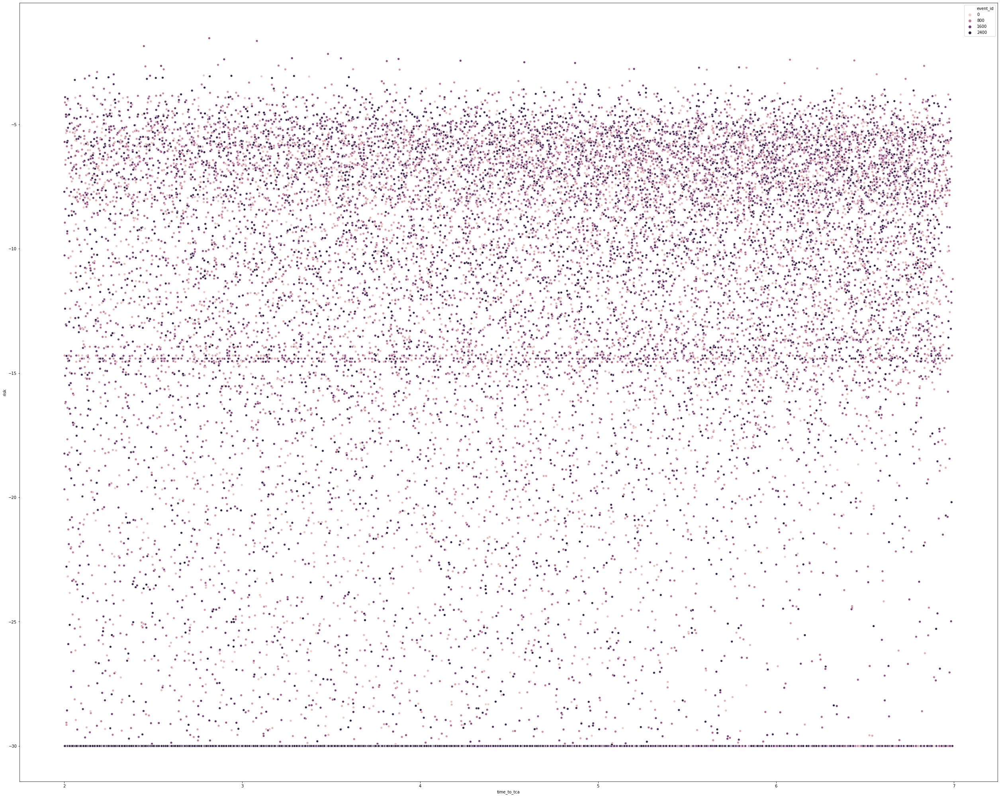

In [15]:
plt.figure(figsize=(44,36))
sns.scatterplot(x="time_to_tca", y="risk", data=df_test, hue="event_id")

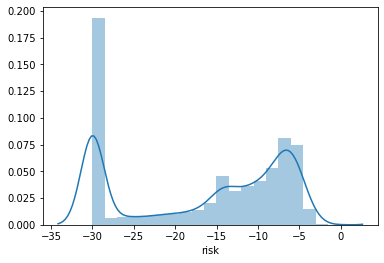

In [16]:
sns.distplot(df_test["risk"]);

In [17]:
df_test["event_id"].value_counts()

362     17
165     16
1813    16
2035    16
1186    16
        ..
845      1
1534     1
954      1
549      1
418      1
Name: event_id, Length: 2167, dtype: int64

In [18]:
print("Lengths of time series:")
df_test.groupby(["event_id"])["risk"].count().value_counts()

Lengths of time series:


15    763
14    440
13    110
5      98
4      93
3      89
1      75
6      74
2      72
8      67
12     62
11     50
7      45
16     43
9      43
10     42
17      1
Name: risk, dtype: int64

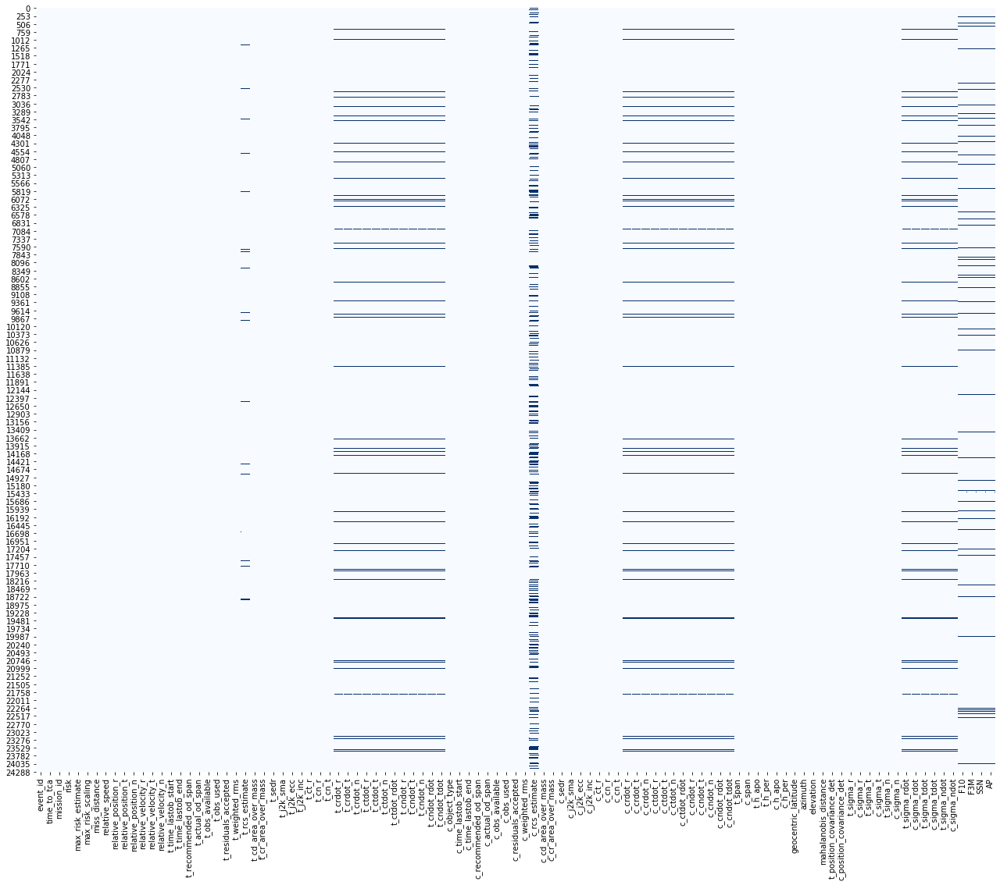

In [19]:
plt.figure(figsize=(22,18))
sns.heatmap(df_test.isnull(),cmap='Blues',cbar=False)

In [20]:
df_test.isnull().sum(axis=0).to_frame().sort_values(by=0, ascending=False)

,0
c_rcs_estimate,7465
AP,1329
SSN,1329
F3M,1329
F10,1329
c_cndot_rdot,1223
c_crdot_r,1223
c_crdot_t,1223
c_crdot_n,1223
c_ctdot_t,1223


In [21]:
df_test.isnull().sum(axis=1).sort_values(ascending=False).to_frame().sort_values(by=0, ascending=False) #row

,0
8220,31
7482,31
227,31
17471,31
17472,31
...,...
188,0
187,0
186,0
185,0


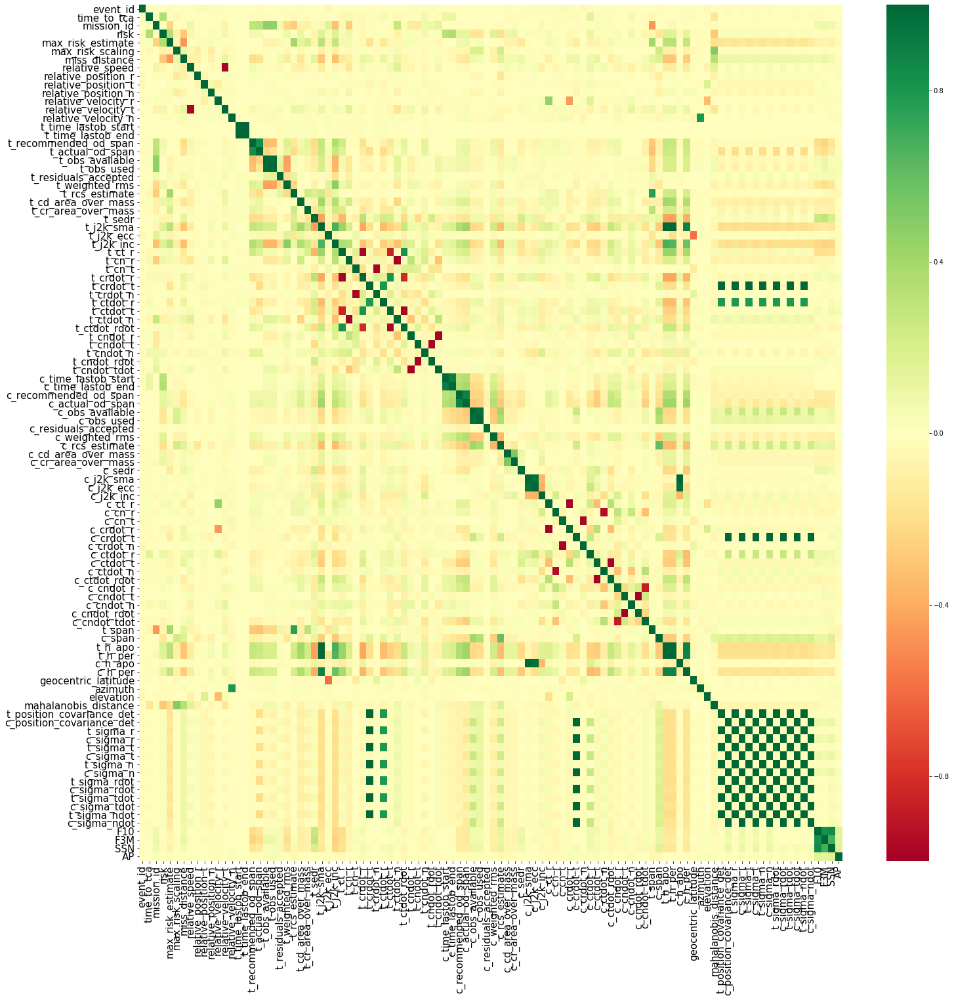

In [22]:
#Global
plt.figure(figsize=(24,24))
hm = sns.heatmap(df_test.corr(),cmap="RdYlGn", annot=False)
bottom, top = hm.get_ylim()
hm.set_ylim(bottom + 0.5, top - 0.5)
hm.set_xticklabels(hm.get_xmajorticklabels(), fontsize = 15)
hm.set_yticklabels(hm.get_ymajorticklabels(), fontsize = 15) 
plt.show()

### F_beta Score implementation

In [ ]:
from sklearn.metrics import mean_squared_error, fbeta_score

real_binary = []
predicted_binary = []

for a in list(real):
    if (a >= -6):
        real_binary.append(1)
    else:
        real_binary.append(0)
        
for a in list(predicted):
    if (a >= -6):
        predicted_binary.append(1)
    else:
        predicted_binary.append(0)

fscore = fbeta_score(real_binary, predicted_binary, 2)

real_mse = real[np.where(real >= -6)]
print(len(real_mse))
predicted_mse = predicted[np.where(real >= -6)]
print(len(predicted_mse))

mse = mean_squared_error(real_mse, predicted_mse)

score= fscore / mse

print(score)